<a href="https://colab.research.google.com/github/SergeiVKalinin/MSE_Fall2024/blob/main/Module_5/20_Optimization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Notebook for the course "Introduction for Machine Learning in Materials Science", Fall 2024

Instructore: Sergei V. Kalinin

Let's make the world map

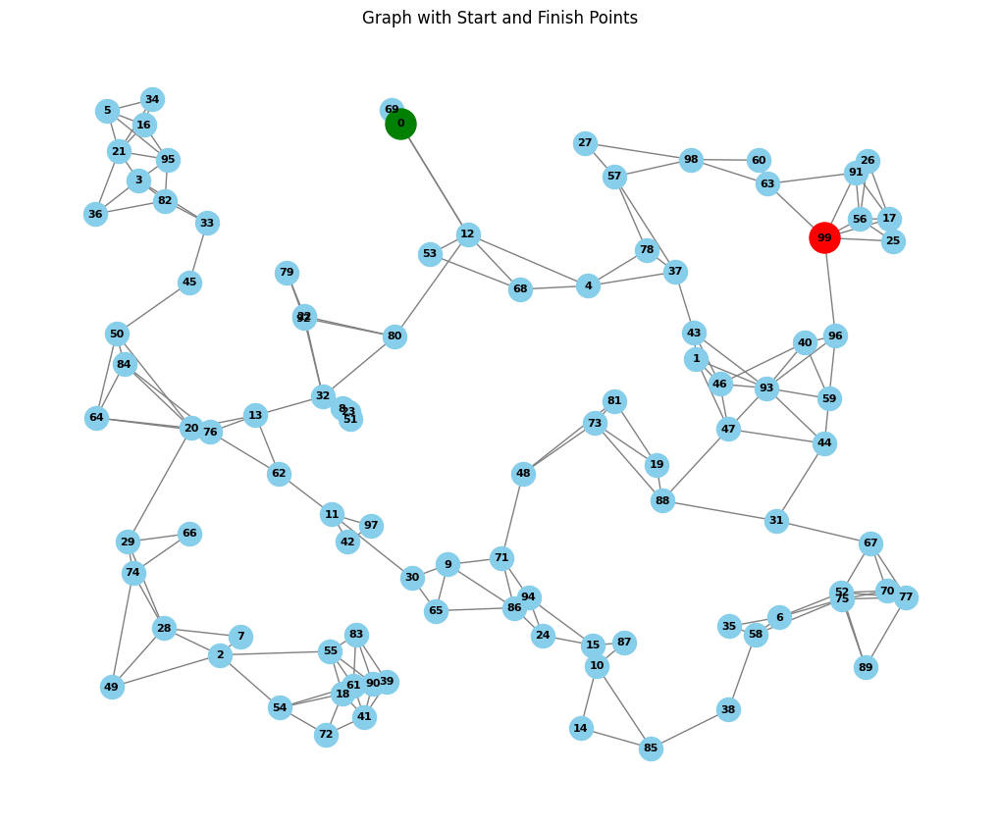

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
import random

# Set seed for reproducibility
np.random.seed(42)

# Generate 100 random points in 2D
n_points = 100
points = np.random.rand(n_points, 2)

# Create a graph
G = nx.Graph()

# Add nodes with their positions
for i in range(n_points):
    G.add_node(i, pos=points[i])

# Function to get k nearest neighbors based on Euclidean distance
def get_nearest_neighbors(point_idx, points, k):
    """Return k nearest neighbors for the point at point_idx."""
    distances = np.linalg.norm(points - points[point_idx], axis=1)
    nearest_neighbors = np.argsort(distances)[1:k+1]  # Skip the point itself (distance 0)
    return nearest_neighbors

# Connect each point to 2-4 nearest spatial neighbors
for i in range(n_points):
    k = random.randint(2, 4)
    neighbors = get_nearest_neighbors(i, points, k)
    for neighbor in neighbors:
        distance = np.linalg.norm(points[i] - points[neighbor])  # Euclidean distance
        G.add_edge(i, neighbor, weight=distance)

# Set start and finish points
start_node = 0  # Top-left corner
finish_node = n_points - 1  # Bottom-right corner

# Visualize the graph with start and finish points highlighted
plt.figure(figsize=(10, 8))
pos = nx.get_node_attributes(G, 'pos')
nx.draw(G, pos, with_labels=True, node_size=300, node_color="skyblue", font_size=8, font_weight="bold", edge_color="gray")
nx.draw_networkx_nodes(G, pos, nodelist=[start_node], node_color="green", label="Start", node_size=500)
nx.draw_networkx_nodes(G, pos, nodelist=[finish_node], node_color="red", label="Finish", node_size=500)
plt.title("Graph with Start and Finish Points")
plt.show()


And experiment with the A* algorithm

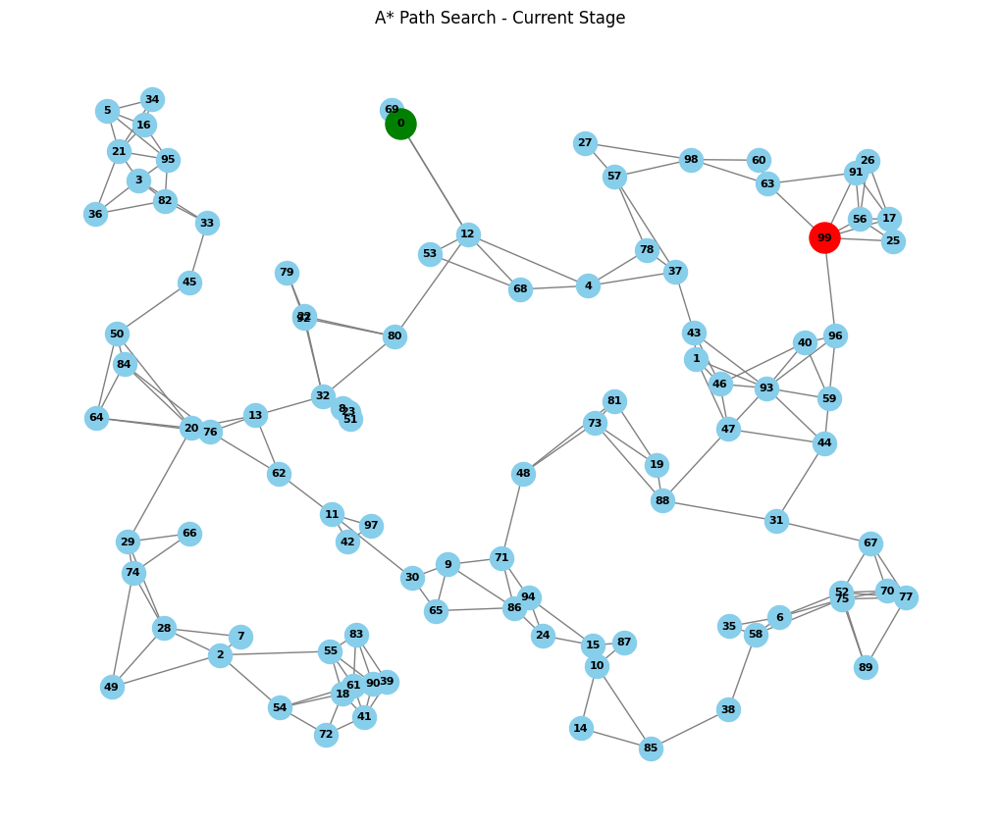

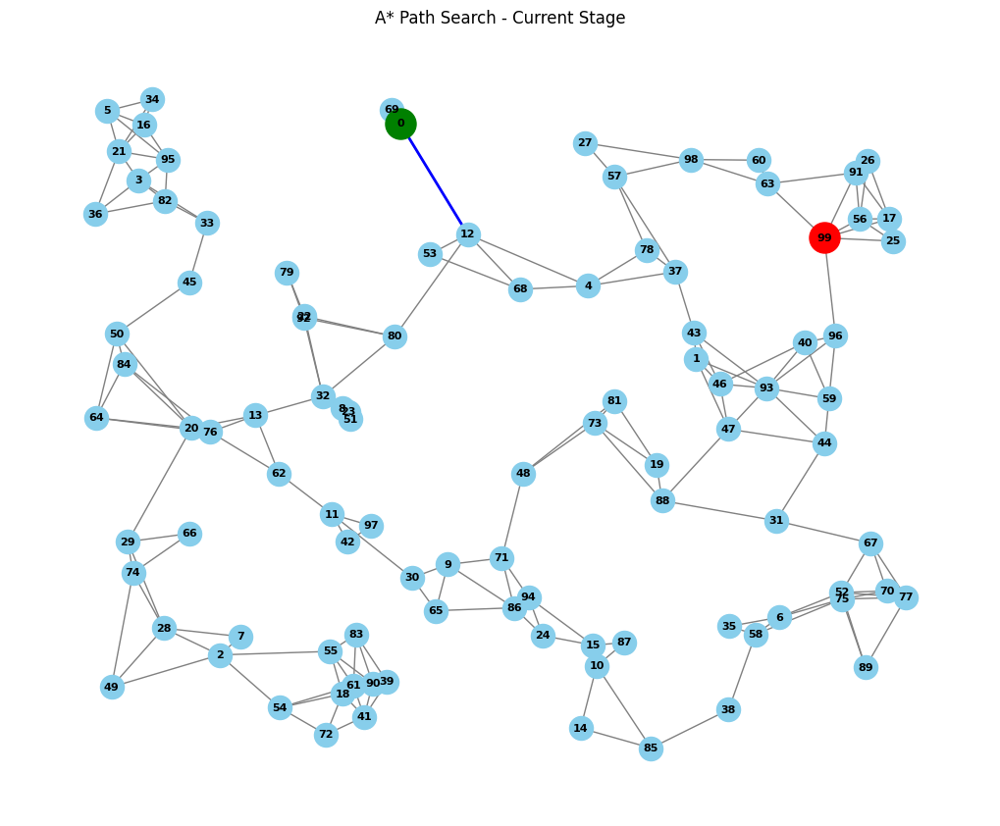

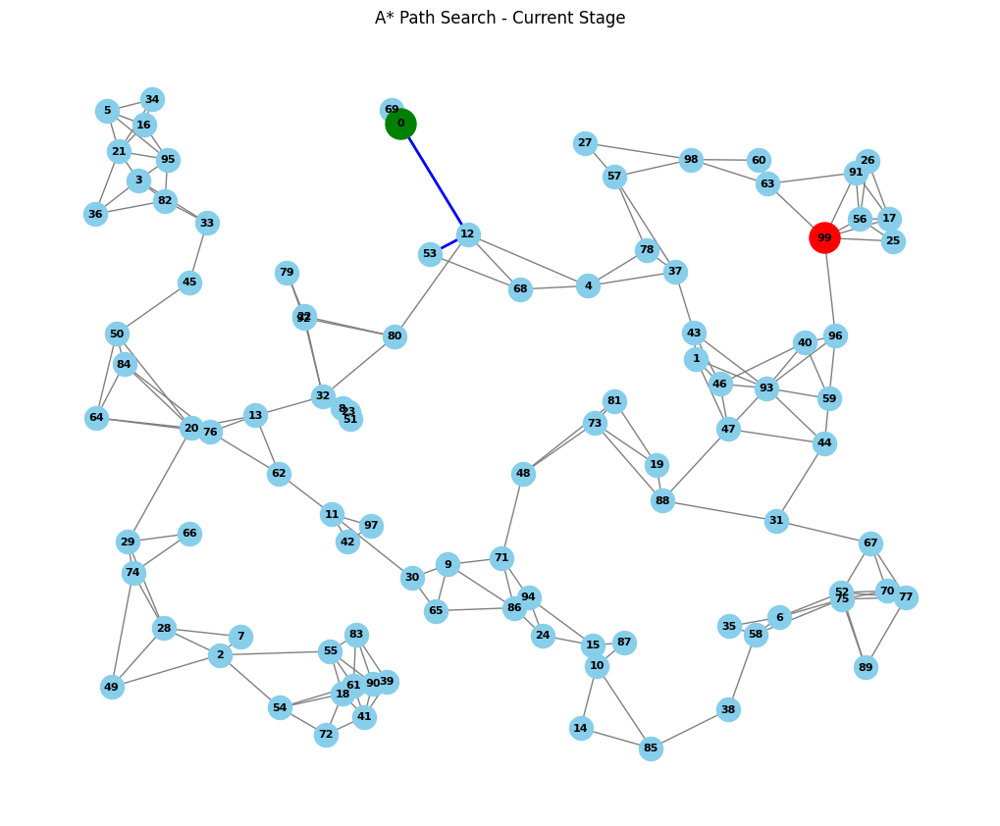

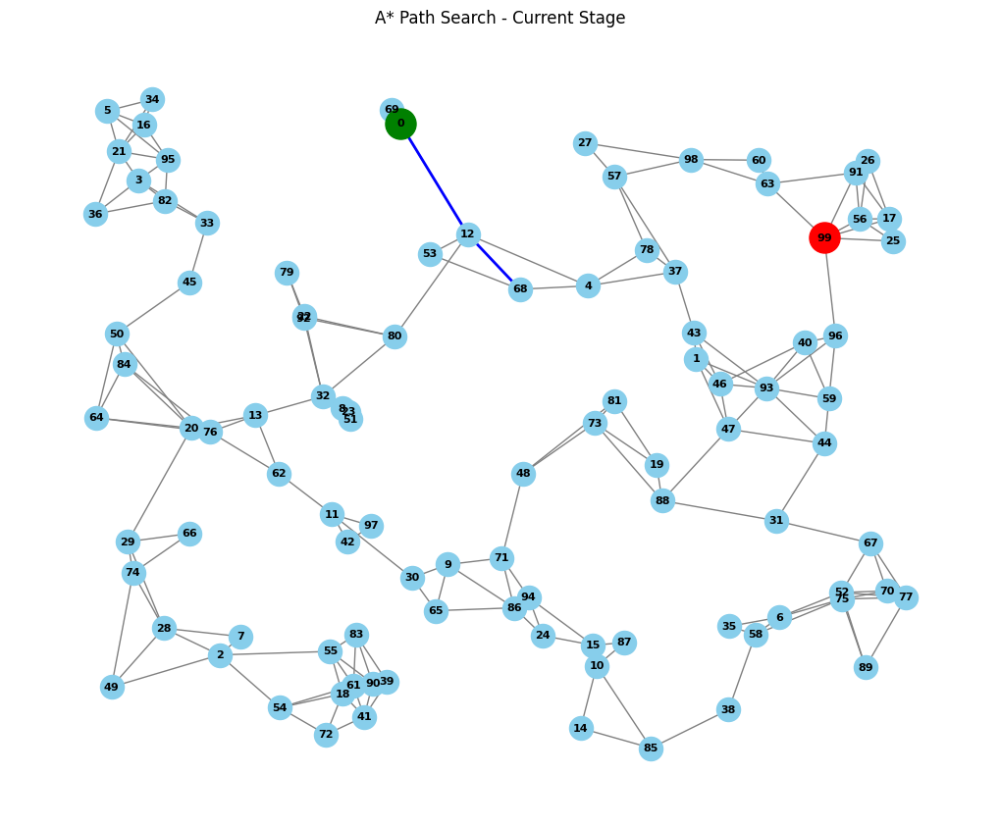

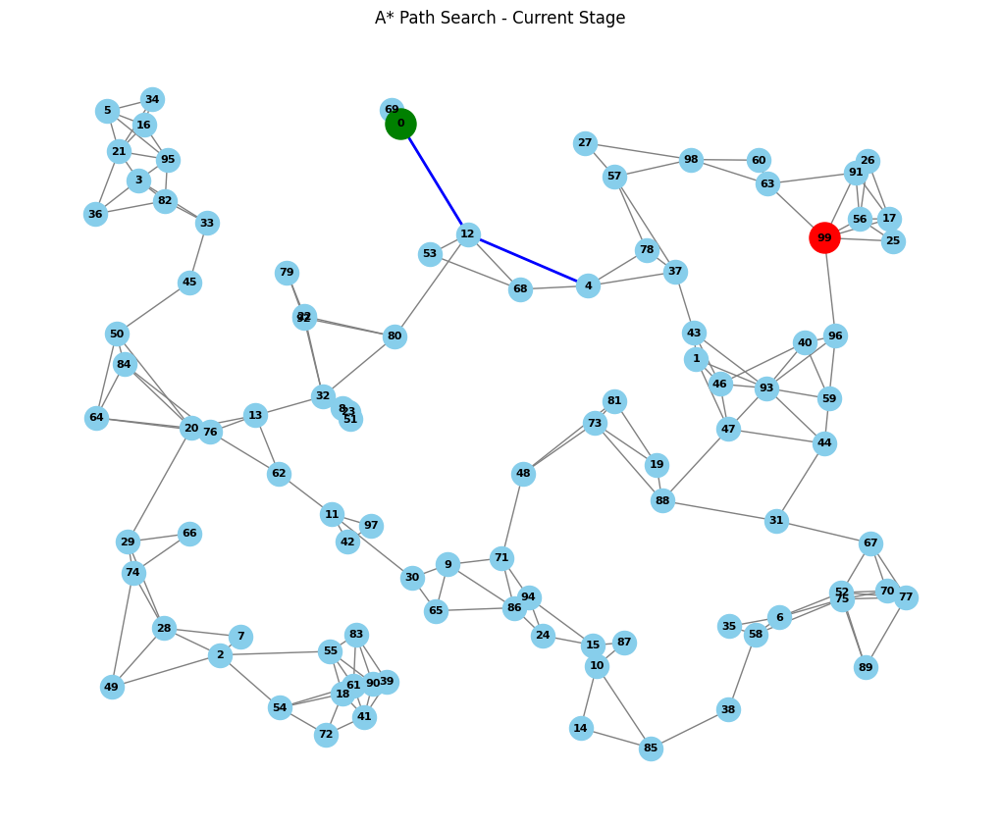

...

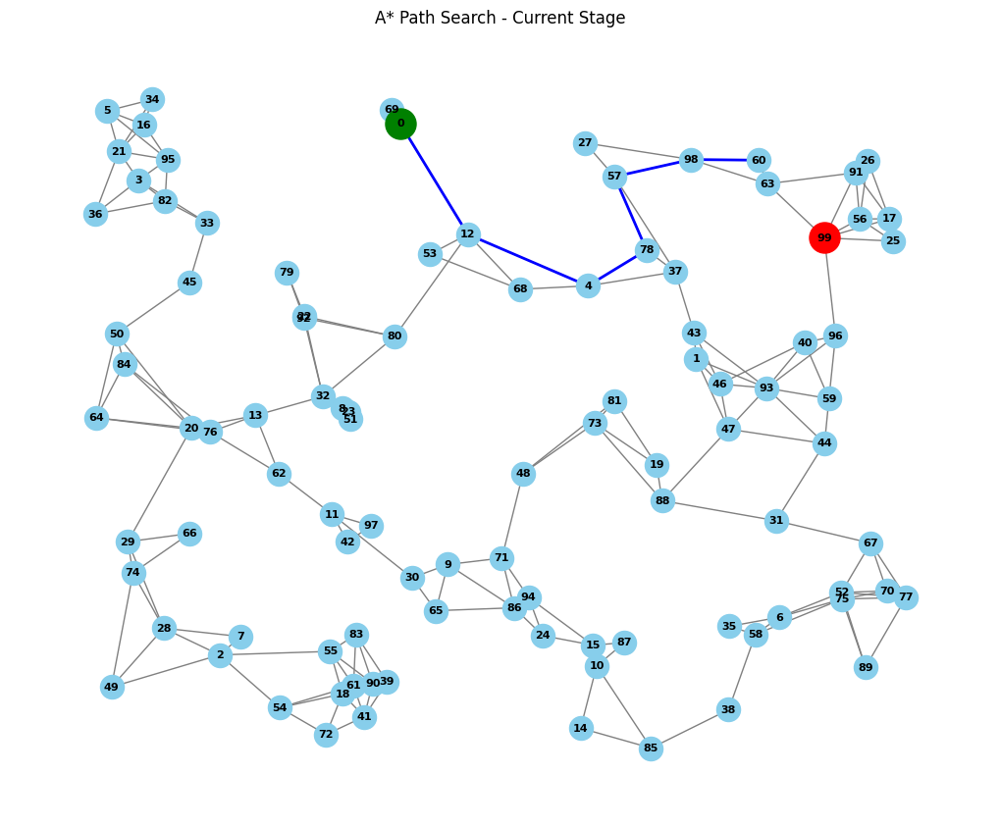

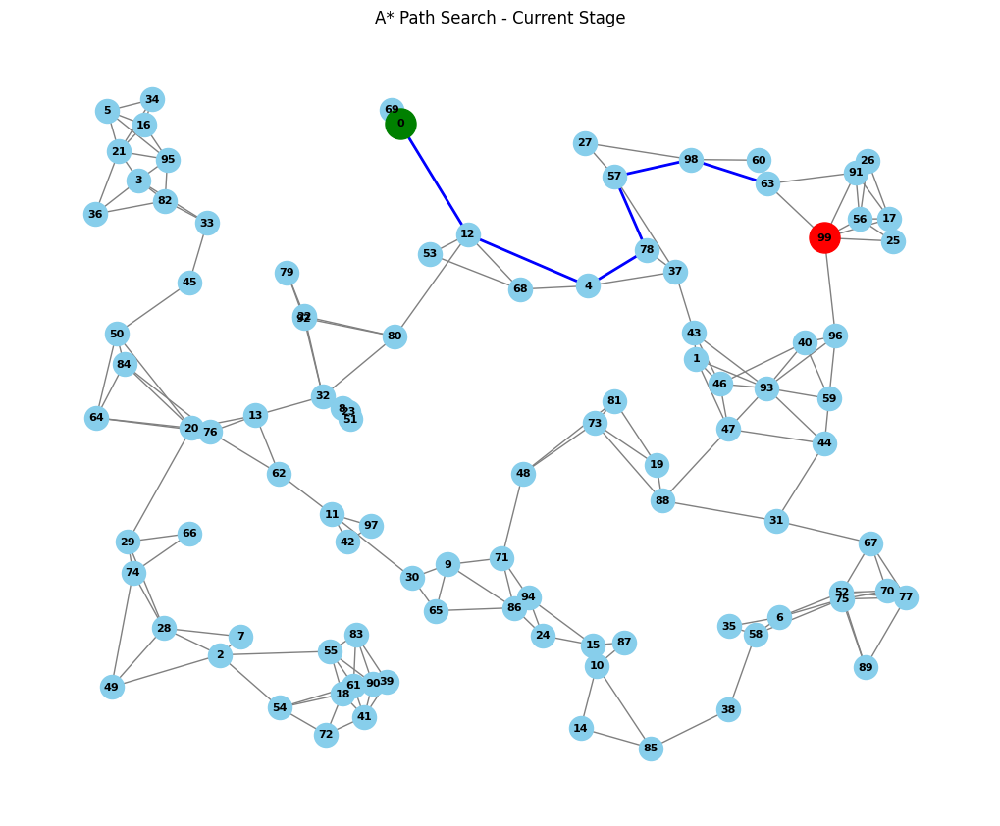

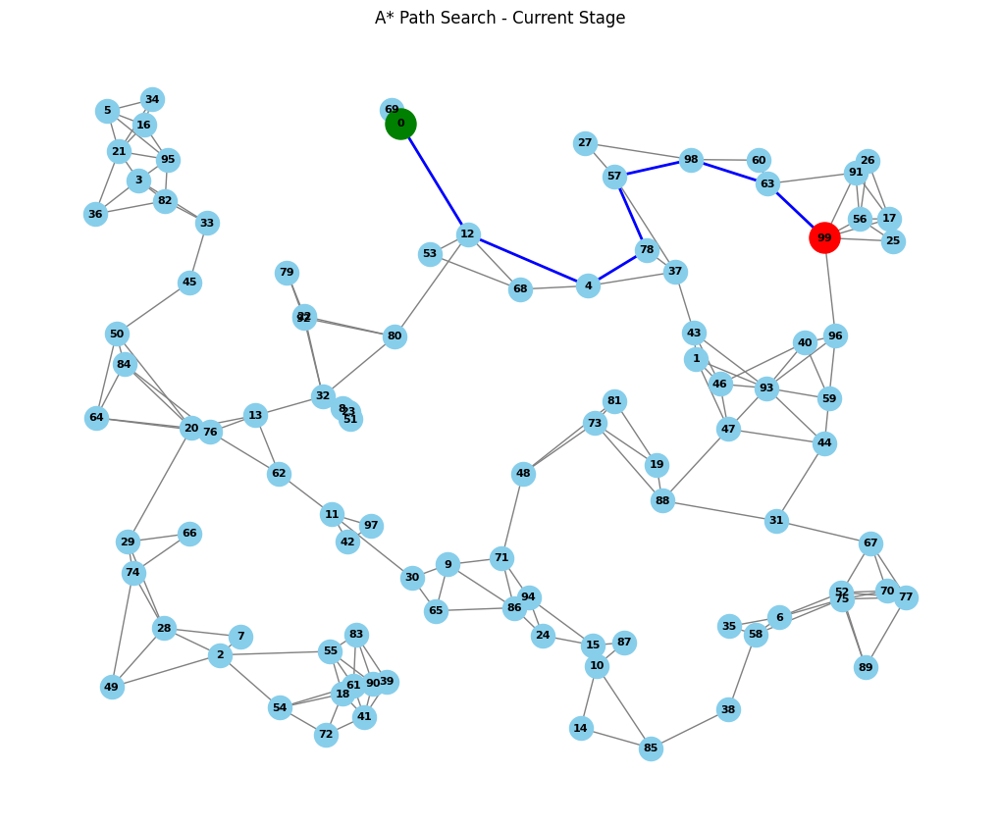

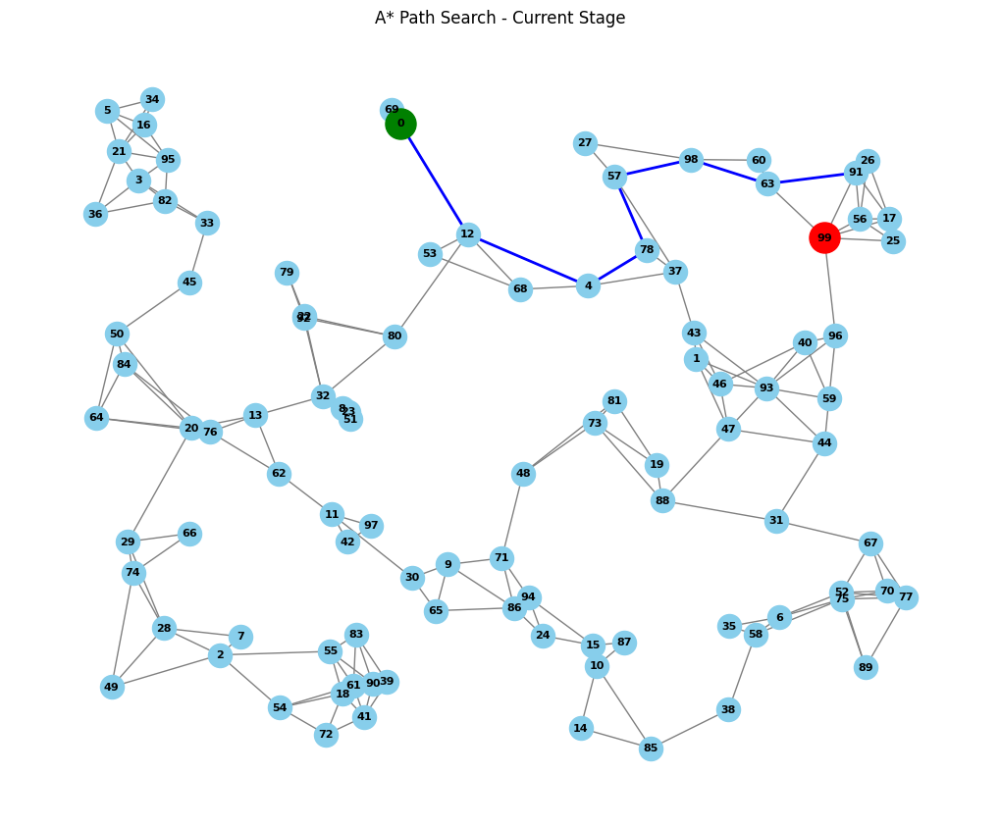

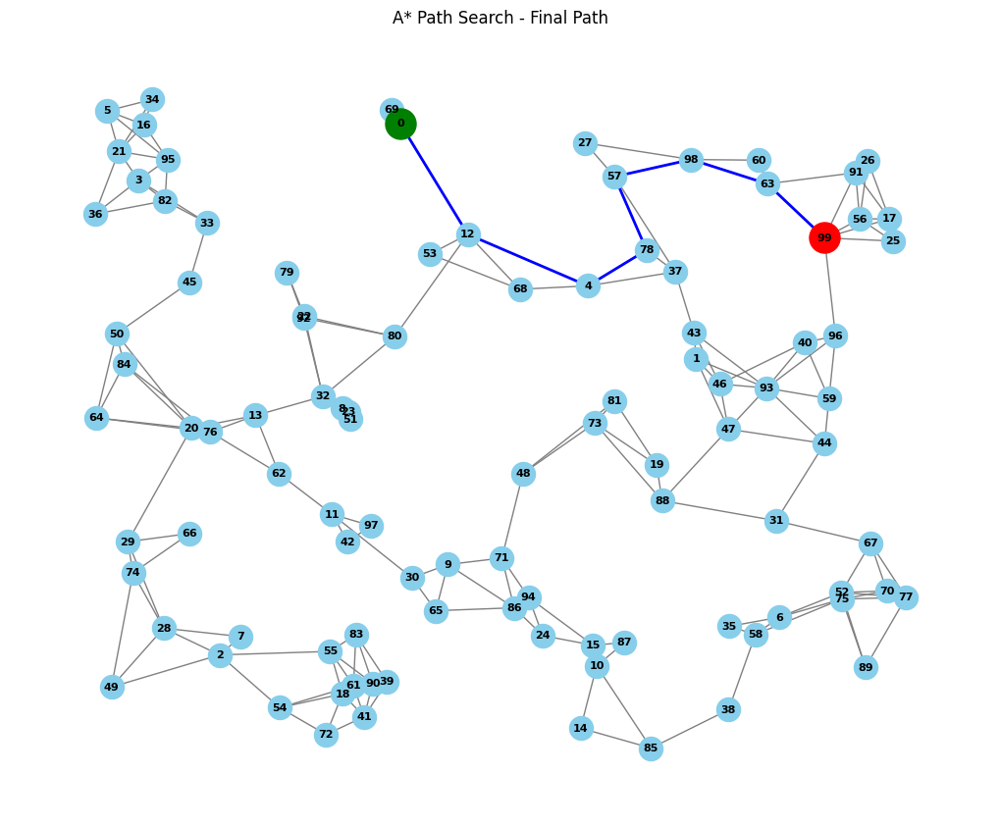

In [2]:
from queue import PriorityQueue

# A* algorithm
def a_star_search(graph, start, goal):
    frontier = PriorityQueue()
    frontier.put((0, start))
    came_from = {start: None}
    cost_so_far = {start: 0}

    while not frontier.empty():
        current = frontier.get()[1]

        # Stop if we reach the goal
        if current == goal:
            break

        for next_node in graph.neighbors(current):
            new_cost = cost_so_far[current] + graph[current][next_node]['weight']
            if next_node not in cost_so_far or new_cost < cost_so_far[next_node]:
                cost_so_far[next_node] = new_cost
                priority = new_cost + np.linalg.norm(points[next_node] - points[goal])  # Heuristic: Euclidean distance
                frontier.put((priority, next_node))
                came_from[next_node] = current

                # Visualize intermediate stages
                visualize_path(graph, start, came_from, next_node, goal)

    # Reconstruct path
    return reconstruct_path(came_from, start, goal)

# Function to reconstruct the path from came_from dictionary
def reconstruct_path(came_from, start, goal):
    current = goal
    path = []
    while current != start:
        path.append(current)
        current = came_from[current]
    path.append(start)
    path.reverse()
    return path

# Function to visualize the current path
def visualize_path(graph, start, came_from, current, goal):
    path = reconstruct_path(came_from, start, current)

    plt.figure(figsize=(10, 8))
    nx.draw(graph, pos, with_labels=True, node_size=300, node_color="skyblue", font_size=8, font_weight="bold", edge_color="gray")
    nx.draw_networkx_nodes(graph, pos, nodelist=[start], node_color="green", node_size=500)
    nx.draw_networkx_nodes(graph, pos, nodelist=[goal], node_color="red", node_size=500)
    nx.draw_networkx_edges(graph, pos, edgelist=list(zip(path, path[1:])), edge_color="blue", width=2)
    plt.title("A* Path Search - Current Stage")
    plt.show()

# Perform A* search from start to goal and visualize intermediate stages
final_path = a_star_search(G, start_node, finish_node)

# Visualize the final path
plt.figure(figsize=(10, 8))
nx.draw(G, pos, with_labels=True, node_size=300, node_color="skyblue", font_size=8, font_weight="bold", edge_color="gray")
nx.draw_networkx_nodes(G, pos, nodelist=[start_node], node_color="green", node_size=500)
nx.draw_networkx_nodes(G, pos, nodelist=[finish_node], node_color="red", node_size=500)
nx.draw_networkx_edges(G, pos, edgelist=list(zip(final_path, final_path[1:])), edge_color="blue", width=2)
plt.title("A* Path Search - Final Path")
plt.show()


Let's compare it to the breadth first search

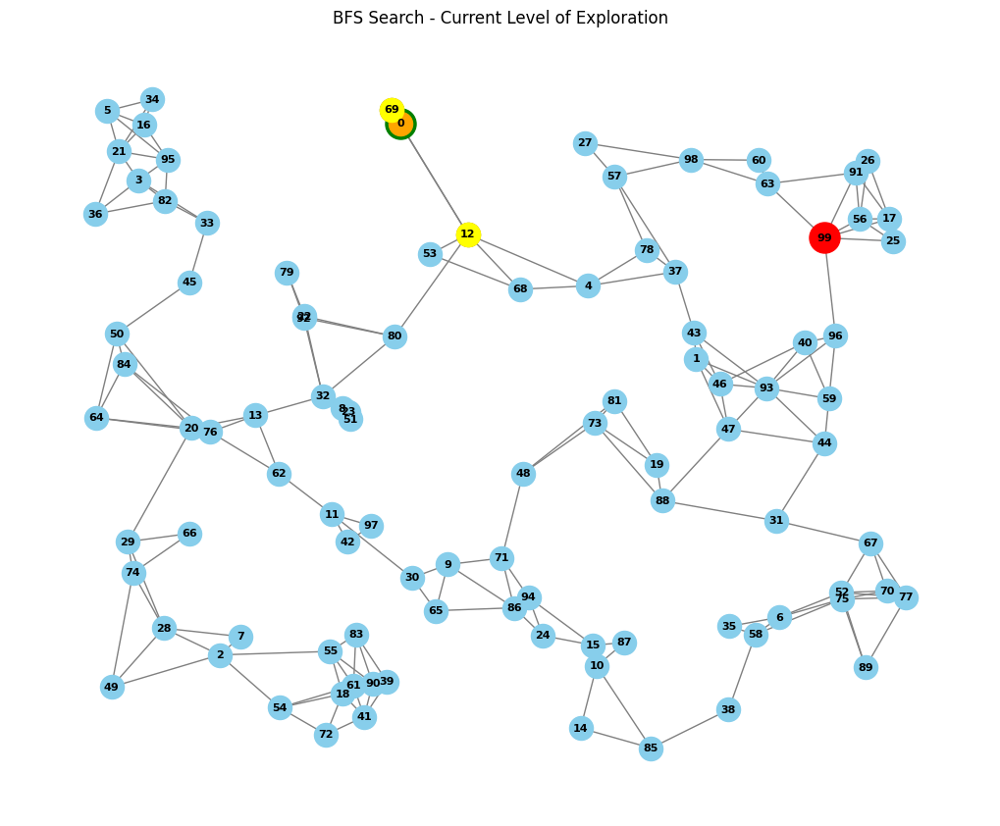

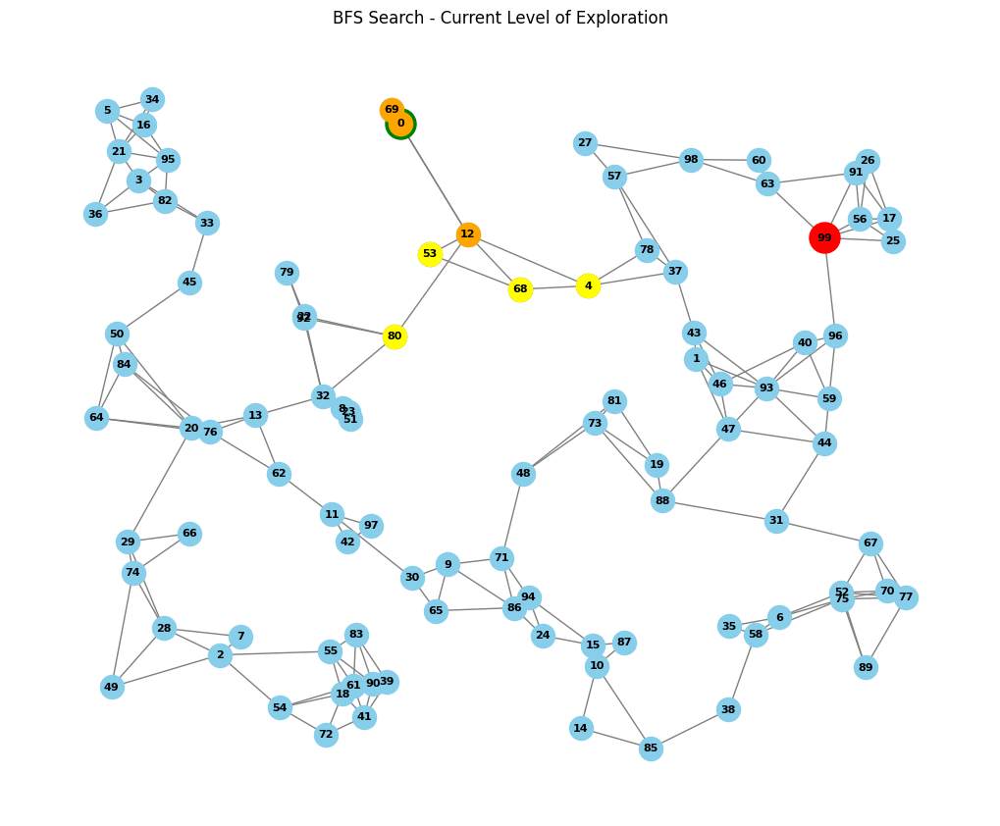

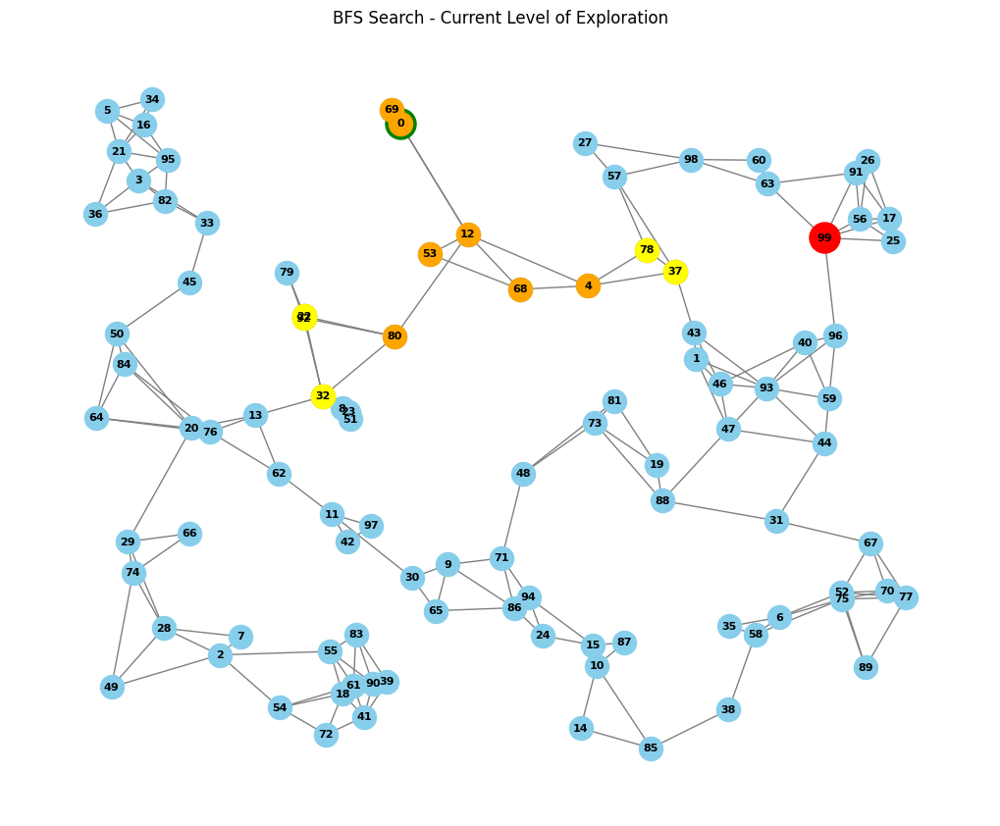

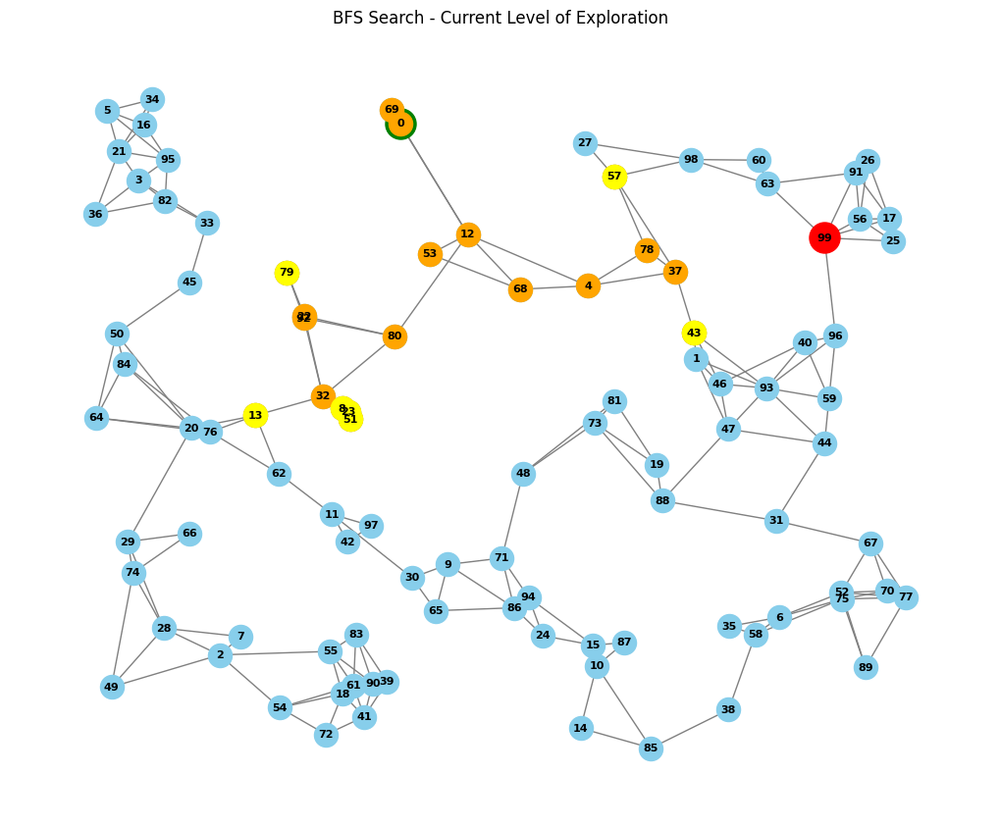

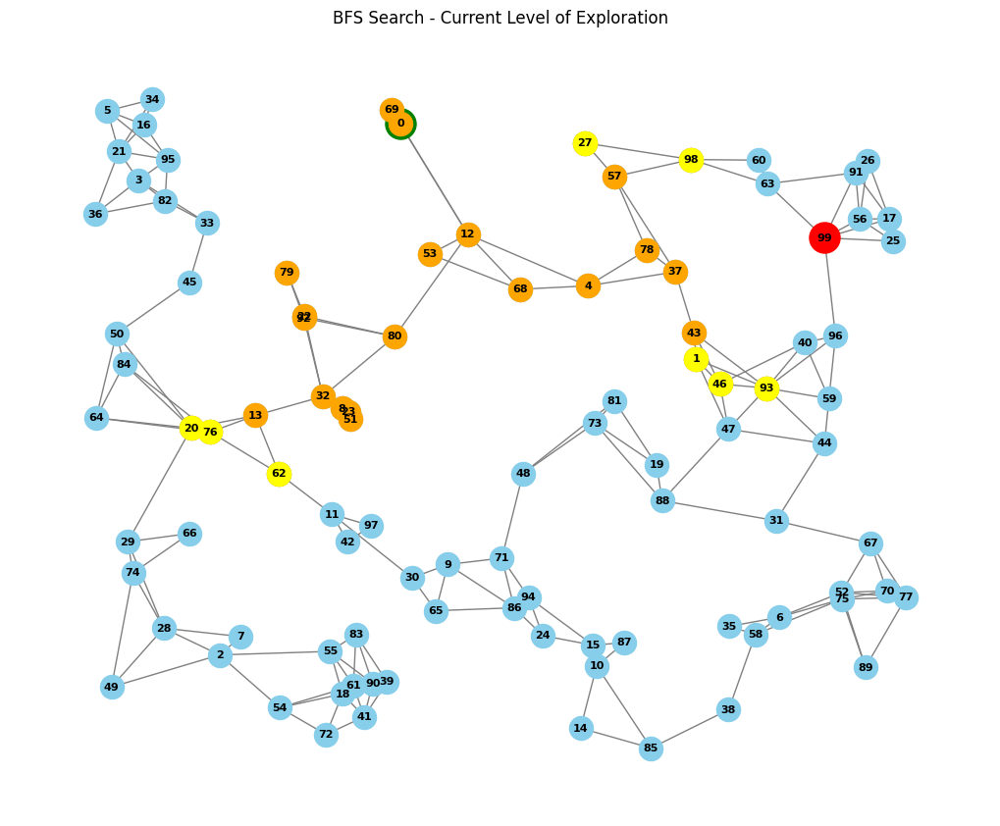

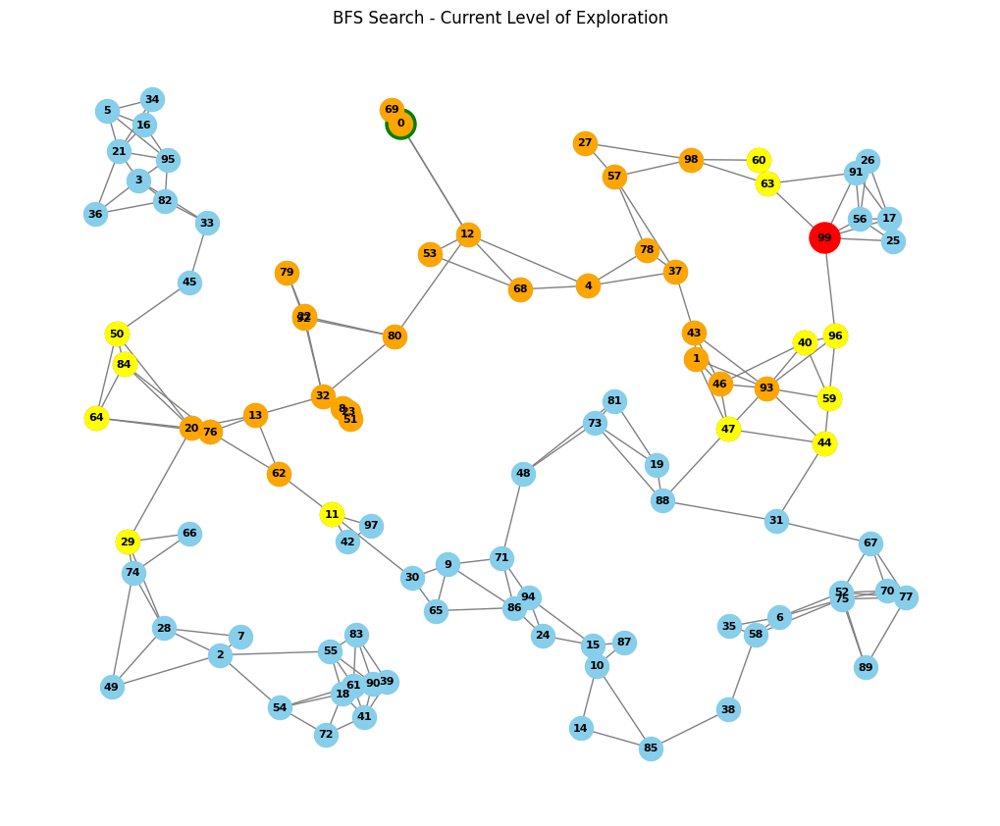

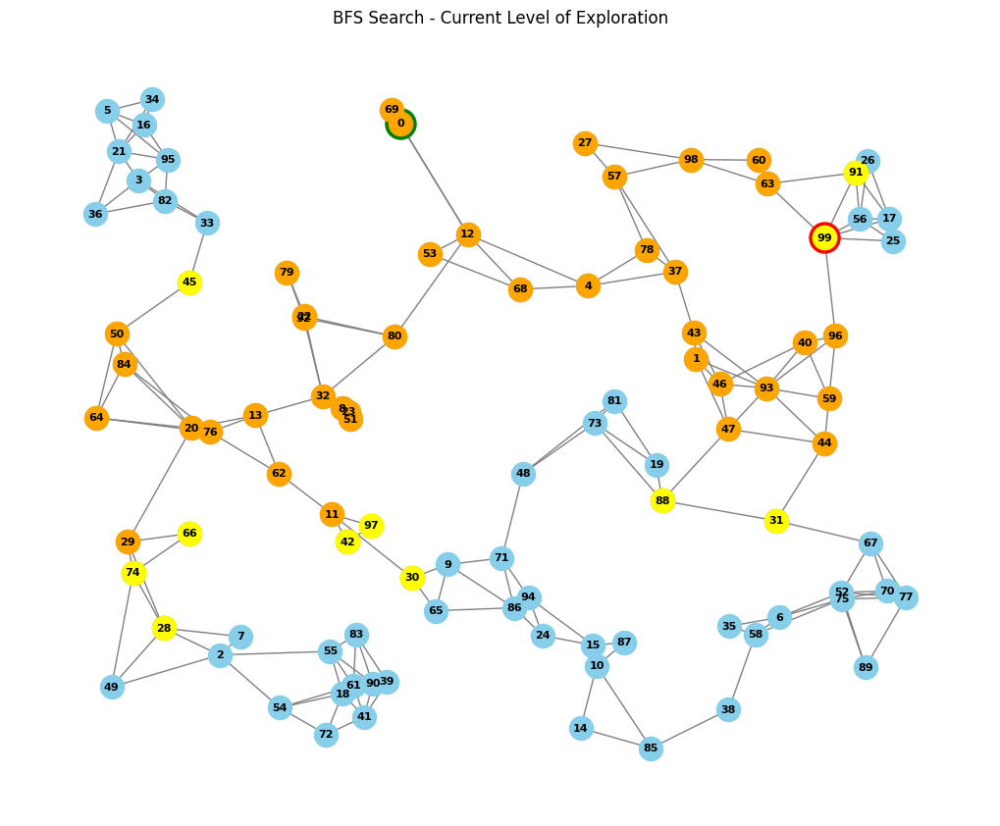

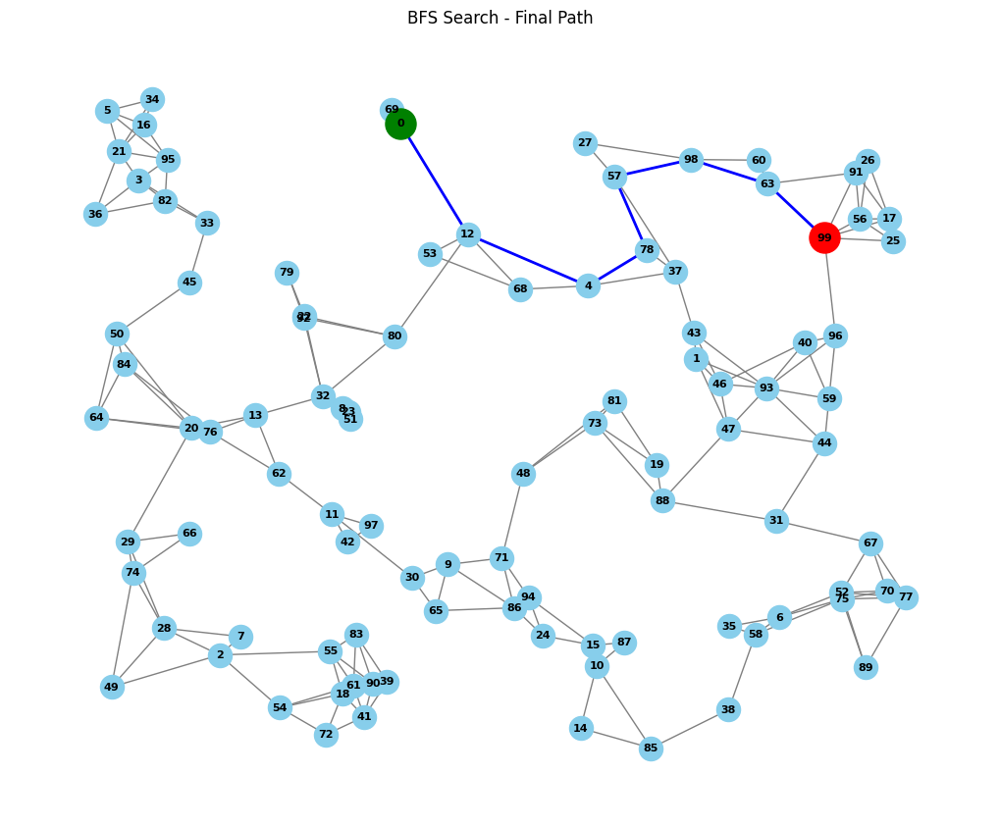

In [3]:
# Breadth-First Search (BFS) algorithm
def bfs_search(graph, start, goal):
    frontier = [start]
    came_from = {start: None}

    while frontier:
        current_level = []
        for current in frontier:
            # Stop if we reach the goal
            if current == goal:
                return reconstruct_path(came_from, start, goal)

            # Explore neighbors
            for next_node in graph.neighbors(current):
                if next_node not in came_from:
                    came_from[next_node] = current
                    current_level.append(next_node)

        # Visualize each level of exploration
        visualize_bfs(graph, start, goal, came_from, current_level)

        # Update the frontier for the next level
        frontier = current_level

# Function to visualize the current BFS level
def visualize_bfs(graph, start, goal, came_from, current_level):
    explored_nodes = list(came_from.keys())

    plt.figure(figsize=(10, 8))
    nx.draw(graph, pos, with_labels=True, node_size=300, node_color="skyblue", font_size=8, font_weight="bold", edge_color="gray")
    nx.draw_networkx_nodes(graph, pos, nodelist=[start], node_color="green", node_size=500)
    nx.draw_networkx_nodes(graph, pos, nodelist=[goal], node_color="red", node_size=500)
    nx.draw_networkx_nodes(graph, pos, nodelist=explored_nodes, node_color="orange", node_size=300)
    nx.draw_networkx_nodes(graph, pos, nodelist=current_level, node_color="yellow", node_size=300)
    plt.title("BFS Search - Current Level of Exploration")
    plt.show()

# Perform BFS search from start to goal and visualize level-wise exploration
final_bfs_path = bfs_search(G, start_node, finish_node)

# Visualize the final path for BFS
plt.figure(figsize=(10, 8))
nx.draw(G, pos, with_labels=True, node_size=300, node_color="skyblue", font_size=8, font_weight="bold", edge_color="gray")
nx.draw_networkx_nodes(G, pos, nodelist=[start_node], node_color="green", node_size=500)
nx.draw_networkx_nodes(G, pos, nodelist=[finish_node], node_color="red", node_size=500)
nx.draw_networkx_edges(G, pos, edgelist=list(zip(final_bfs_path, final_bfs_path[1:])), edge_color="blue", width=2)
plt.title("BFS Search - Final Path")
plt.show()


And depth first

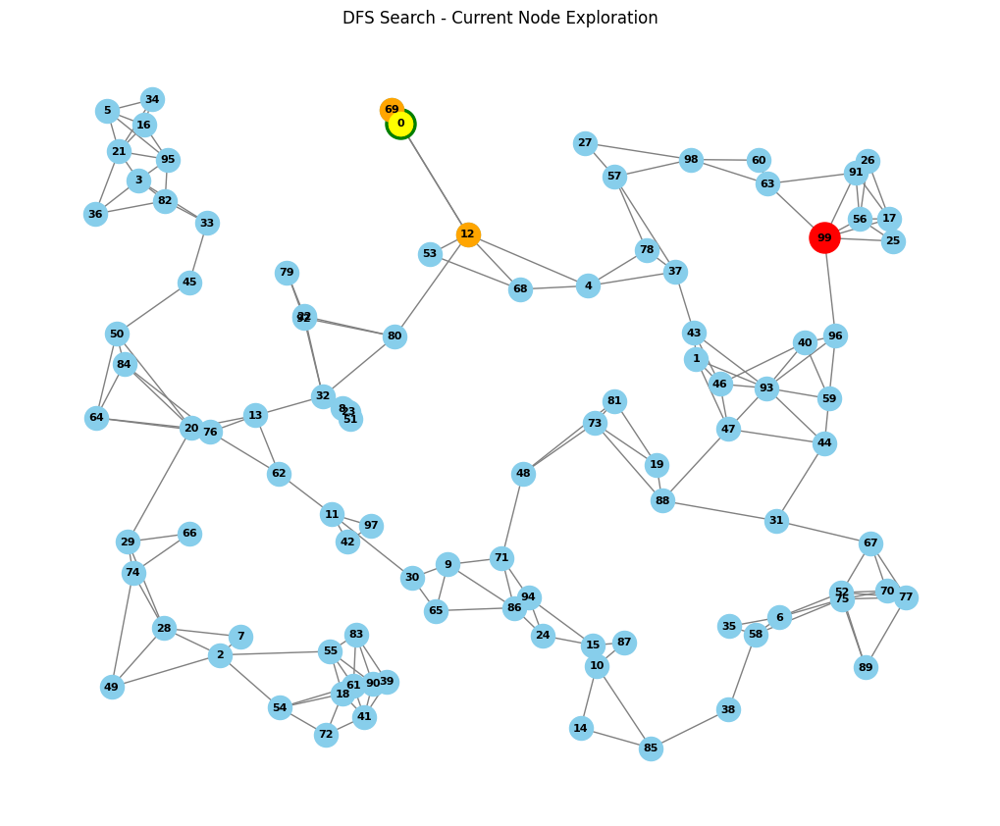

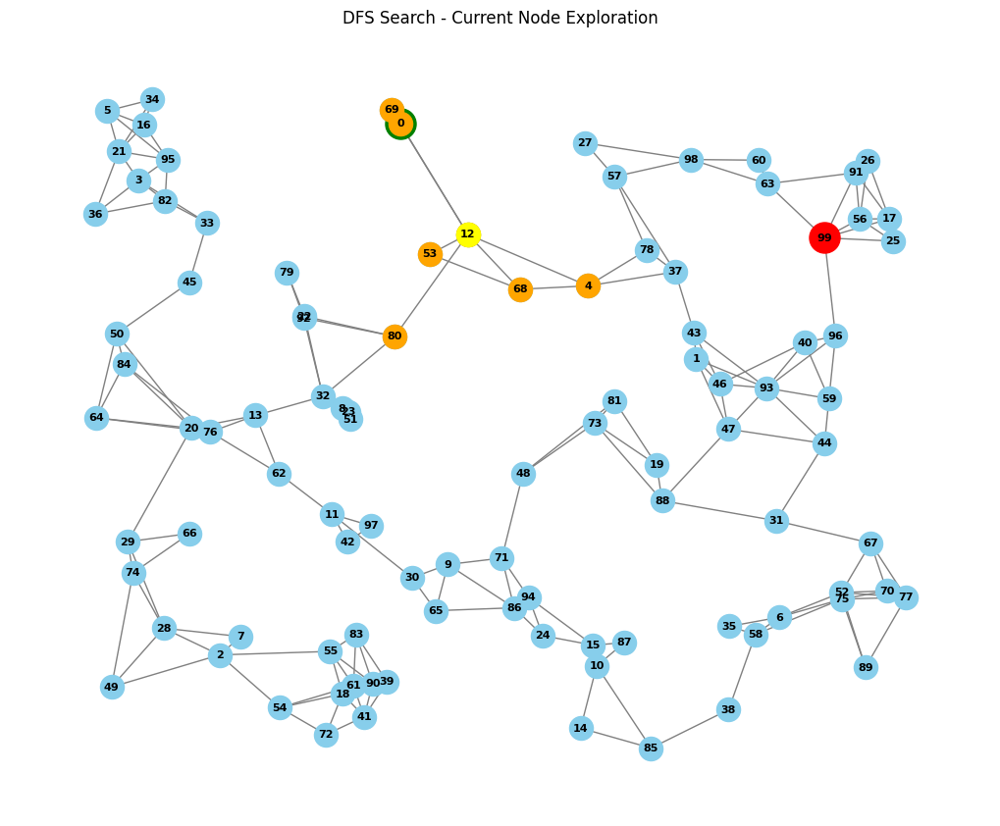

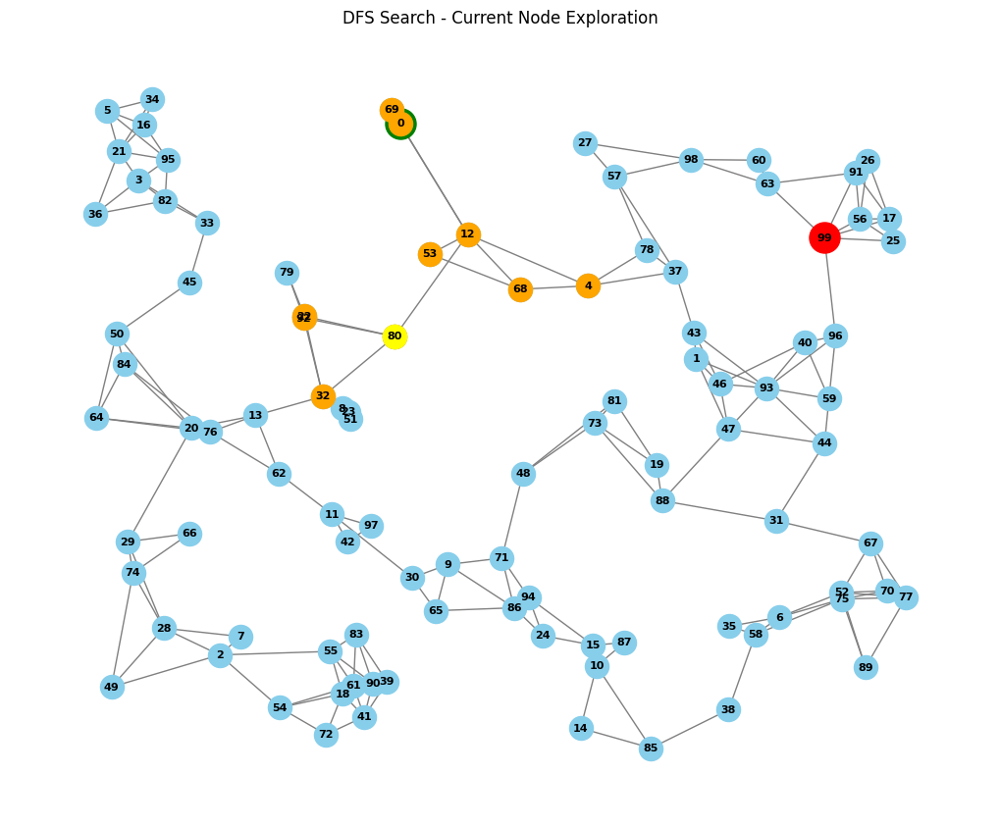

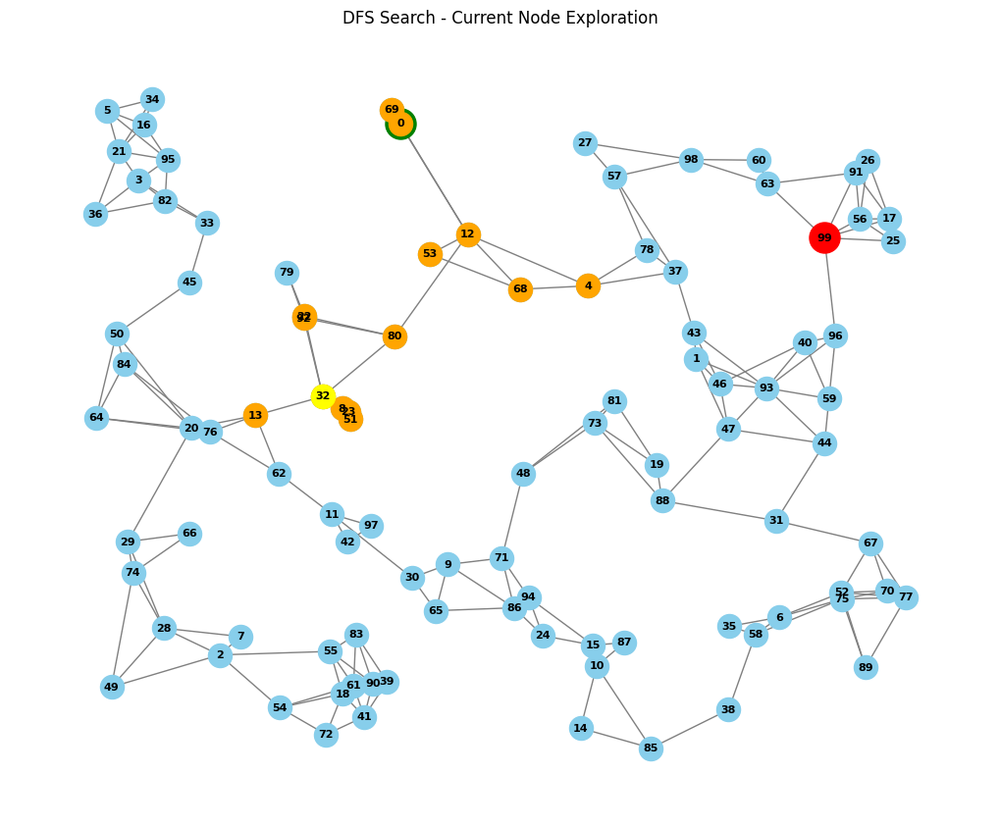

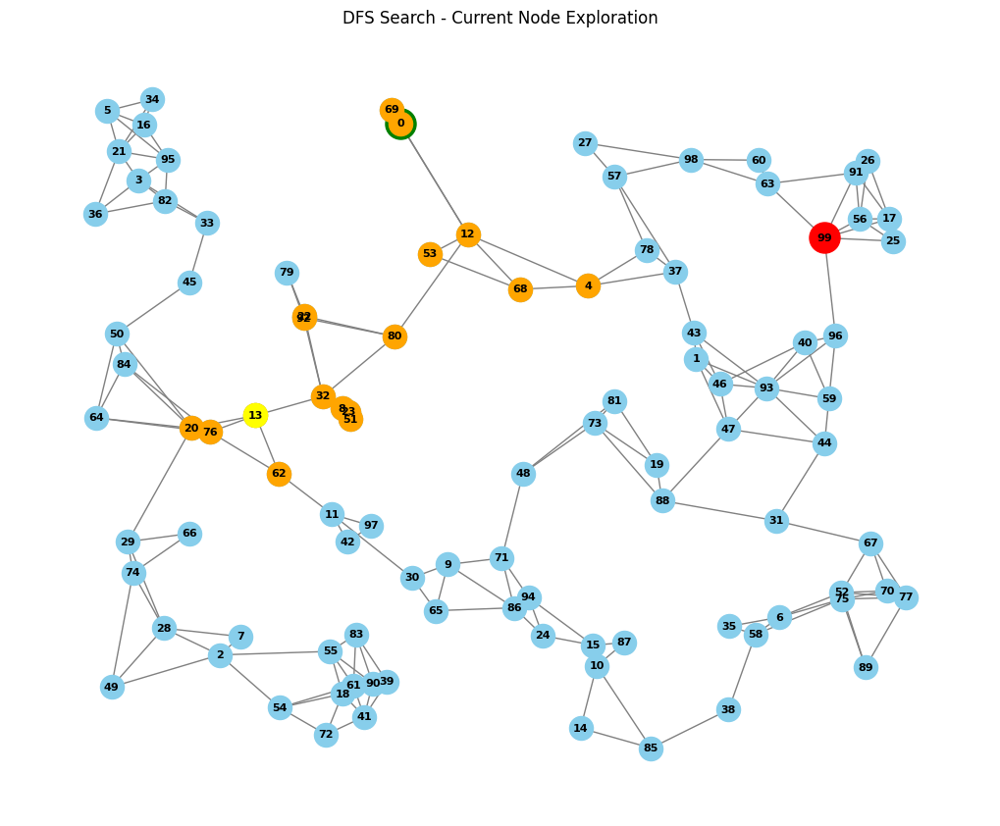

...

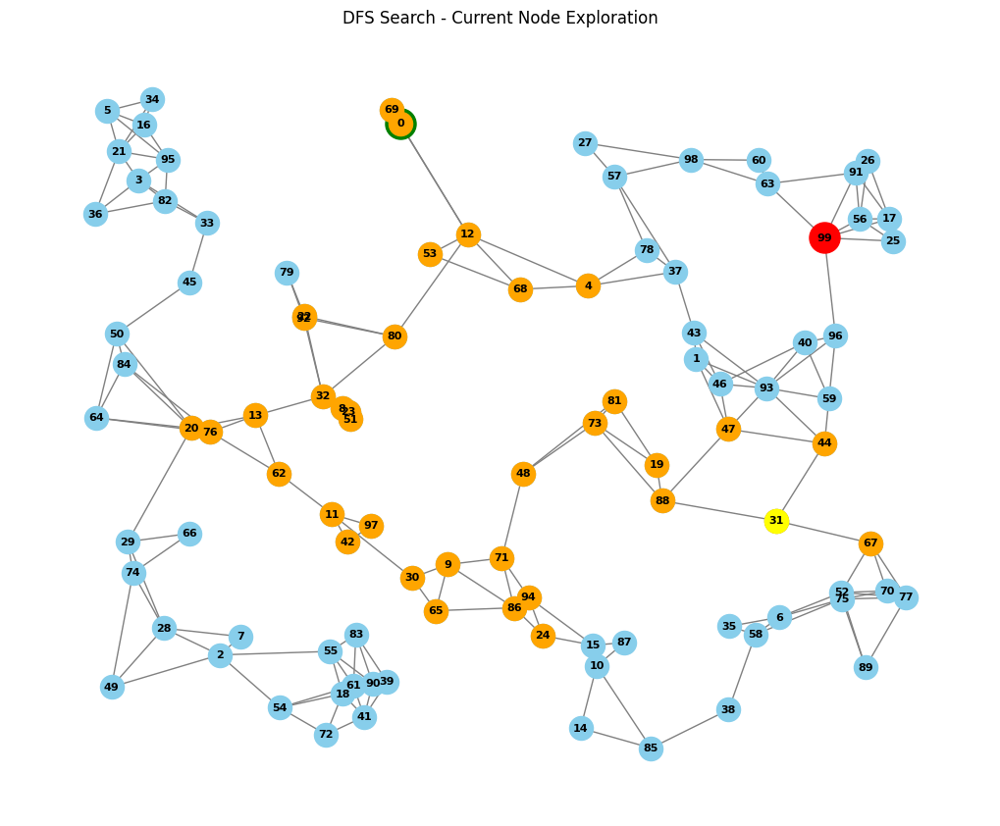

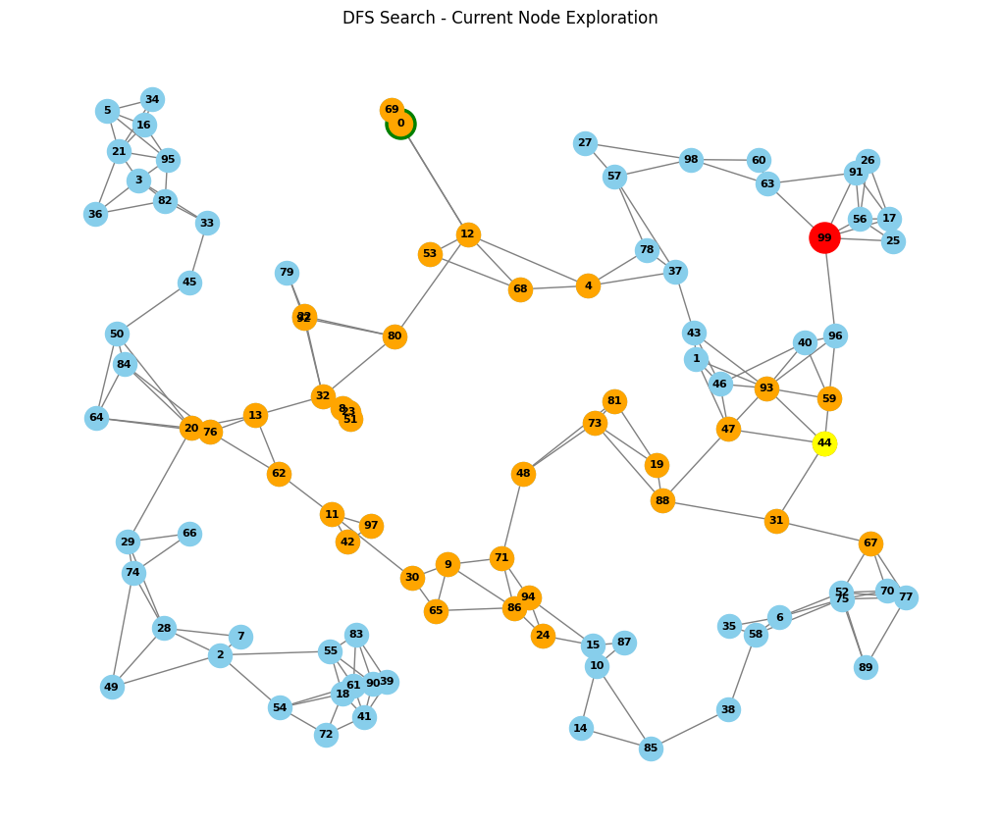

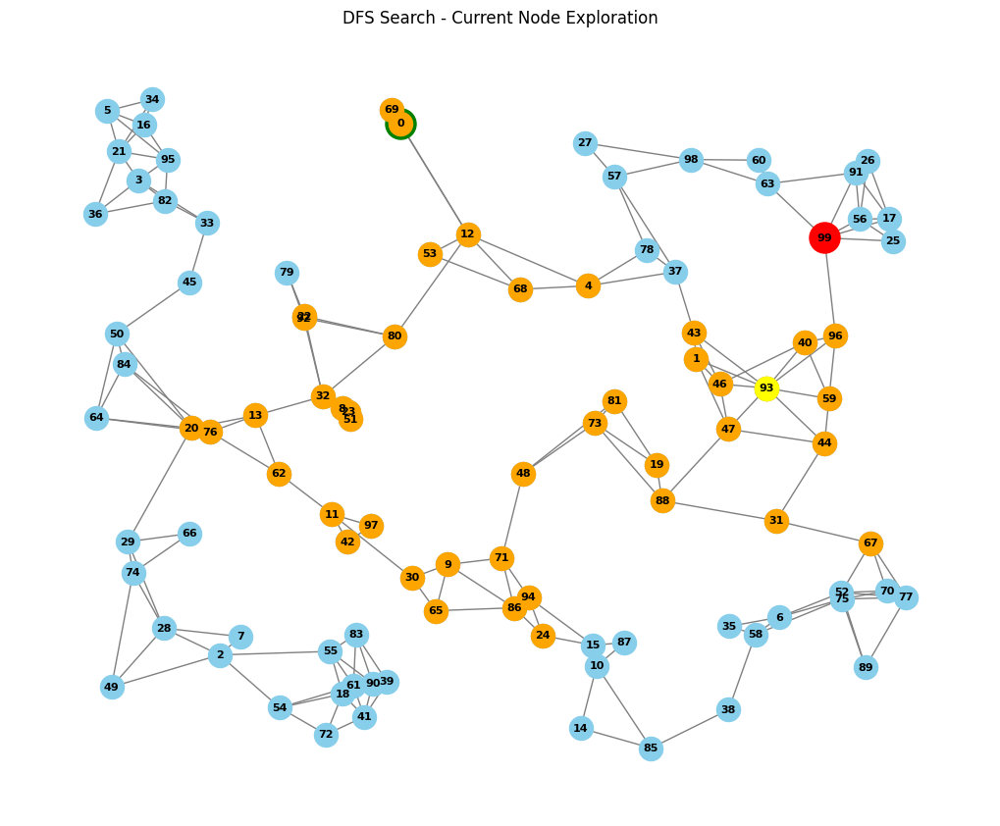

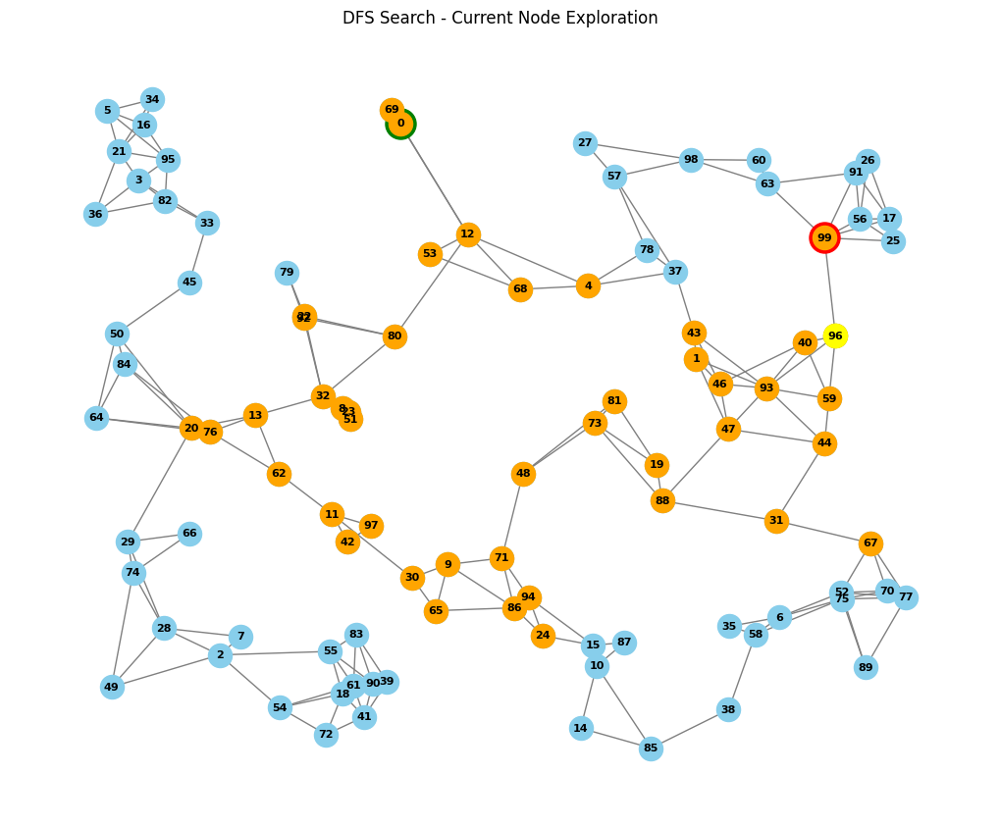

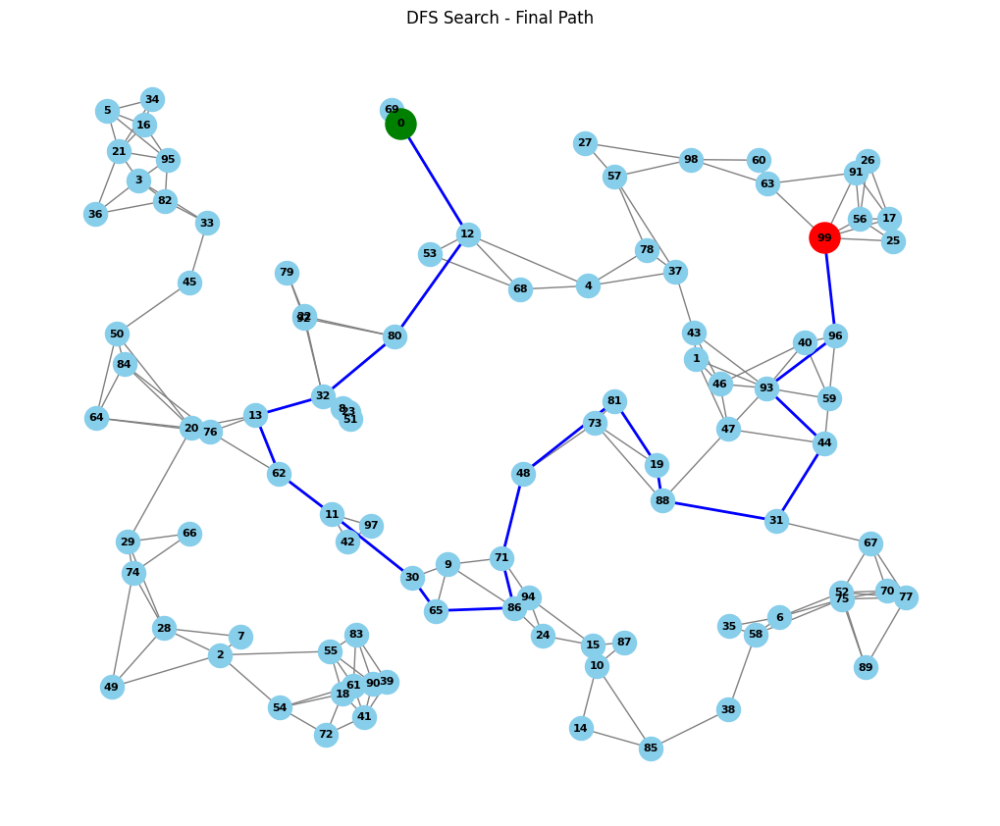

In [4]:
# Depth-First Search (DFS) algorithm
def dfs_search(graph, start, goal):
    frontier = [start]
    came_from = {start: None}

    while frontier:
        current = frontier.pop()

        # Stop if we reach the goal
        if current == goal:
            return reconstruct_path(came_from, start, goal)

        # Explore neighbors
        for next_node in graph.neighbors(current):
            if next_node not in came_from:
                came_from[next_node] = current
                frontier.append(next_node)

        # Visualize the current exploration
        visualize_dfs(graph, start, goal, came_from, current)

# Function to visualize the current DFS exploration
def visualize_dfs(graph, start, goal, came_from, current):
    explored_nodes = list(came_from.keys())

    plt.figure(figsize=(10, 8))
    nx.draw(graph, pos, with_labels=True, node_size=300, node_color="skyblue", font_size=8, font_weight="bold", edge_color="gray")
    nx.draw_networkx_nodes(graph, pos, nodelist=[start], node_color="green", node_size=500)
    nx.draw_networkx_nodes(graph, pos, nodelist=[goal], node_color="red", node_size=500)
    nx.draw_networkx_nodes(graph, pos, nodelist=explored_nodes, node_color="orange", node_size=300)
    nx.draw_networkx_nodes(graph, pos, nodelist=[current], node_color="yellow", node_size=300)
    plt.title("DFS Search - Current Node Exploration")
    plt.show()

# Perform DFS search from start to goal and visualize exploration step by step
final_dfs_path = dfs_search(G, start_node, finish_node)

# Visualize the final path for DFS
plt.figure(figsize=(10, 8))
nx.draw(G, pos, with_labels=True, node_size=300, node_color="skyblue", font_size=8, font_weight="bold", edge_color="gray")
nx.draw_networkx_nodes(G, pos, nodelist=[start_node], node_color="green", node_size=500)
nx.draw_networkx_nodes(G, pos, nodelist=[finish_node], node_color="red", node_size=500)
nx.draw_networkx_edges(G, pos, edgelist=list(zip(final_dfs_path, final_dfs_path[1:])), edge_color="blue", width=2)
plt.title("DFS Search - Final Path")
plt.show()
